In [1]:
from matplotlib import pyplot as plt 
import numpy as np 
import pandas as pd
import sys
sys.path.append('../')
from sklearn.metrics import r2_score
import matplotlib.dates as mdates
import matplotlib as mpl
import os
import seaborn as sns
import shap
from scipy.optimize import curve_fit
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

version = '2021-07-01'
areas = ['CE', 'Nordic', 'GB']
area_names = ['Continental Europe', 'Nordic', 'Great Britain']
area_colors=['C0', 'C1', 'C2']

data_folder = '../data/{}/'
version_folder = '../data/{}/version_{}/'
fit_folder = '../results/model_fit/{}/version_{}/target_{}/'
figure_path = '../../../Papers/interpretable_ml_frequency_prediction/figures/'

files = {'GB': 'Nationalgrid/cleansed_2015-01-01_to_2019-12-31.h5',
         'CE': 'TransnetBW/cleansed_2015-01-01_to_2019-12-31.h5',
         'Nordic': 'Fingrid/cleansed_2015-01-01_to_2019-12-31.h5' }

input_cols = ['gen_other', 'gen_solar', 'gen_wind_on', 'gen_waste', 'gen_nuclear',
       'gen_biomass', 'gen_gas', 'gen_run_off_hydro', 'gen_oil',
       'gen_pumped_hydro', 'gen_other_renew', 'gen_reservoir_hydro',
       'gen_hard_coal', 'gen_wind_off', 'gen_geothermal', 'gen_lignite',
       'load', 'gen_coal_gas', 'total_gen', 'synchronous_gen', 'load_ramp',
       'total_gen_ramp', 'other_ramp', 'solar_ramp', 'wind_on_ramp',
       'waste_ramp', 'nuclear_ramp', 'biomass_ramp', 'gas_ramp',
       'run_off_hydro_ramp', 'oil_ramp', 'pumped_hydro_ramp',
       'other_renew_ramp', 'reservoir_hydro_ramp', 'hard_coal_ramp',
       'wind_off_ramp', 'geothermal_ramp', 'lignite_ramp', 'coal_gas_ramp',
       'forecast_error_wind_on', 'forecast_error_wind_off',
       'forecast_error_solar', 'forecast_error_total_gen',
       'forecast_error_load', 'forecast_error_load_ramp',
       'forecast_error_total_gen_ramp', 'forecast_error_wind_off_ramp',
       'forecast_error_wind_on_ramp', 'forecast_error_solar_ramp',
       'solar_day_ahead', 'wind_on_day_ahead', 'scheduled_gen_total',
       'prices_day_ahead', 'load_day_ahead', 'wind_off_day_ahead', 'month',
       'weekday', 'hour', 'load_ramp_day_ahead', 'total_gen_ramp_day_ahead',
       'wind_off_ramp_day_ahead', 'wind_on_ramp_day_ahead',
       'solar_ramp_day_ahead', 'price_ramp_day_ahead','gen_fossil_peat','fossil_peat_ramp', 'residual']


input_col_names = ['Generation other', 'Solar generation', 'Onshore wind generation', 'Waste generation', 'Nuclear generation',
       'Biomass generation', 'Gas generation', 'Run-off-river hydro generation', 'Oil generation',
       'Pumped hydro generation', 'Other renewable generation', 'Reservoir hydro generation',
       'Hard coal generation', 'Wind offshore generation', 'Geothermal generation', 'Lignite generation',
       'Load', 'Coal gas generation', 'Total generation', 'Synchronous generation', 'Load ramp',
       'Total generation ramp', 'Other ramp', 'Solar ramp', 'Onshore wind ramp',
       'Waste ramp', 'Nuclear ramp', 'Biomass ramp', 'Gas ramp',
       'Run-off-river hydro ramp', 'Oil ramp', 'Pumped hydro ramp',
       'Other renewable ramp', 'Reservoir hydro ramp', 'Hard coal ramp',
       'Offshore wind ramp', 'geothermal_ramp', 'Lignite ramp', 'Coal gas ramp',
       'Forecast error onshore wind', 'Forecast error offshore wind',
       'Forecast error solar', 'Forecast error total generation',
       'Forecast error load', 'Forecast error load ramp',
       'Forecast error generation ramp', 'Forecast error offshore wind ramp',
       'Forecast error onshore wind ramp', 'Forecast error solar ramp',
       'Solar day-ahead', 'Onshore wind day-ahead', 'Scheduled generation',
       'Prices day-ahead', 'Load day-ahead', 'Offshore wind day-ahead', 'Month',
       'Weekday', 'Hour', 'Load ramp day-ahead', 'Generation ramp day-ahead',
       'Offshore wind ramp day-ahead', 'Onshore wind ramp day-ahead',
       'Solar ramp day-ahead', 'Price ramp day-ahead', 'Fossil peat generation', 'Fossil peat ramp', 'Residual']

#Remark: The unit for prices varies among the areas. Here, we only display GB price data and thus use £ as a unit for simplicity.
# "input_col_names_units_general" contains the general unit of "currency" instead. 
input_col_names_units = ['Generation other [GW]', 'Solar generation [GW]', 'Onshore wind generation [GW]', 'Waste generation [GW]', 'Nuclear generation [GW]',
       'Biomass generation [GW]', 'Gas generation [GW]', 'Run-off-river hydro generation [GW]', 'Oil generation [GW]',
       'Pumped hydro generation [GW]', 'Other renewable generation [GW]', 'Reservoir hydro generation [GW]',
       'Hard coal generation [GW]', 'Wind offshore generation [GW]', 'Geothermal generation [GW]', 'Lignite generation [GW]',
       'Load [GW]', 'Coal gas generation [GW]', 'Total generation [GW]', 'Synchronous generation [GW]', 'Load ramp [GW/h]',
       'Total generation ramp [GW/h]', 'Other ramp [GW/h]', 'Solar ramp [GW/h]', 'Onshore wind ramp [GW/h]',
       'Waste ramp [GW/h]', 'Nuclear ramp [GW/h]', 'Biomass ramp [GW/h]', 'Gas ramp [GW/h]',
       'Run-off-river hydro ramp [GW/h]', 'Oil ramp [GW/h]', 'Pumped hydro ramp [GW/h]',
       'Other renewables ramp [GW/h]', 'Reservoir hydro ramp [GW/h]', 'Hard coal ramp [GW/h]',
       'Offshore wind ramp [GW/h]', 'geothermal_ramp [GW/h]', 'Lignite ramp [GW/h]', 'coal_gas_ramp [GW/h]',
       'Forecast error onshore wind [GW]', 'Forecast error offshore wind [GW]',
       'Forecast error solar [GW]', 'Forecast error total generation [GW]',
       'Forecast error load [GW]', 'Forecast error load ramp [GW]',
       'Forecast error generation ramp [GW/h]', 'Forecast error offshore wind ramp [GW/h]',
       'Forecast error onshore wind ramp [GW/h]', 'Forecast error solar ramp [GW/h]',
       'Solar day-ahead [GW]', 'Onshore wind day-ahead [GW]', 'Scheduled generation [GW]',
       'Prices day-ahead [£/MWh]', 'Load day-ahead [GW]', 'Offshore wind day-ahead [GW]', 'Month',
       'Weekday', 'Hour', 'Load ramp day-ahead [GW/h]', 'Generation ramp day-ahead [GW/h]',
       'Offshore wind ramp day-ahead [GW/h]', 'Onshore wind ramp day-ahead [GW/h]',
       'Solar ramp day-ahead [GW/h]', 'Price ramp day-ahead [£/MWh/h]','Fossil peat generation [GW]', 'Fossil peat ramp [GW/h]', 'Residual']

input_col_names_units_general = ['Generation other [GW]', 'Solar generation [GW]', 'Onshore wind generation [GW]', 'Waste generation [GW]', 'Nuclear generation [GW]',
       'Biomass generation [GW]', 'Gas generation [GW]', 'Run-off-river hydro generation [GW]', 'Oil generation [GW]',
       'Pumped hydro generation [GW]', 'Other renewable generation [GW]', 'Reservoir hydro generation [GW]',
       'Hard coal generation [GW]', 'Wind offshore generation [GW]', 'Geothermal generation [GW]', 'Lignite generation [GW]',
       'Load [GW]', 'Coal gas generation [GW]', 'Total generation [GW]', 'synchronous_gen [GW]', 'Load ramp [GW/h]',
       'Total generation ramp [GW/h]', 'Other ramp [GW/h]', 'Solar ramp [GW/h]', 'Onshore wind ramp [GW/h]',
       'Waste ramp [GW/h]', 'Nuclear ramp [GW/h]', 'Biomass ramp [GW/h]', 'Gas ramp [GW/h]',
       'Run-off-river hydro ramp [GW/h]', 'Oil ramp [GW/h]', 'Pumped hydro ramp [GW/h]',
       'Other renewables ramp [GW/h]', 'Reservoir hydro ramp [GW/h]', 'Hard coal ramp [GW/h]',
       'Offshore wind ramp [GW/h]', 'geothermal_ramp [GW/h]', 'Lignite ramp [GW/h]', 'coal_gas_ramp [GW/h]',
       'Forecast error onshore wind [GW]', 'Forecast error offshore wind [GW]',
       'Forecast error solar [GW]', 'Forecast error total generation [GW]',
       'Forecast error load [GW]', 'Forecast error load ramp [GW]',
       'Forecast error generation ramp [GW/h]', 'Forecast error offshore wind ramp [GW/h]',
       'Forecast error onshore wind ramp [GW/h]', 'Forecast error solar ramp [GW/h]',
       'Solar day-ahead [GW]', 'Onshore wind day-ahead [GW]', 'Scheduled generation [GW]',
       'Prices day-ahead [Currency/MWh]', 'Load day-ahead [GW]', 'Offshore wind day-ahead [GW]', 'Month',
       'Weekday', 'Hour', 'Load ramp day-ahead [GW/h]', 'Generation ramp day-ahead [GW/h]',
       'Offshore wind ramp day-ahead [GW/h]', 'Onshore wind ramp day-ahead [GW/h]',
       'Solar ramp day-ahead [GW/h]', 'Price ramp day-ahead [Currency/MWh/h]','Fossil peat generation [GW]', 'Fossil peat ramp [GW/h]', 'Residual']

input_col_names = dict(zip(input_cols, input_col_names))
input_col_names_units = dict(zip(input_cols, input_col_names_units))
input_col_names_units_general = dict(zip(input_cols, input_col_names_units_general))

input_rescale_factors = pd.Series(index=input_cols, data=1/1000)
input_rescale_factors.loc[['weekday', 'hour','month', 'prices_day_ahead','price_ramp_day_ahead']]=1

targets=['f_rocof', 'f_ext', 'f_msd', 'f_integral']
target_names=['RoCoF','Nadir', 'MSD', 'Integral']


# Figure 1

In [2]:
area='CE'
freq = -50 + pd.read_hdf('../../Frequency_data_preparation/{}'.format(files[area])).loc['2015-01-01':'2018-12-31']
input_data =  pd.read_hdf(data_folder.format(area)+'input_actual.h5').join(pd.read_hdf(data_folder.format(area)+'input_forecast.h5'))
outputs = pd.read_hdf(data_folder.format(area)+'outputs.h5')
shap_vals = np.load(fit_folder.format(area, version, 'f_ext')+ 'shap_values_gtb_full.npy')
X_test = pd.read_hdf(version_folder.format(area, version)+'X_test_full.h5')
shap_vals = pd.DataFrame(data=shap_vals, index=X_test.index, columns=X_test.columns)


In [94]:
i = 111
ind = X_test.sort_index().index[X_test.sort_index().index.hour.isin([21,22,23])][i]
print(ind)
print(pd.read_hdf(fit_folder.format(area, version, 'f_ext')+'y_pred.h5').loc[ind])


2016-04-04 22:00:00+02:00
daily_profile    -0.034316
mean_predictor   -0.004752
gtb_day_ahead    -0.031242
gtb_full         -0.024772
Name: 2016-04-04 22:00:00+02:00, dtype: float64


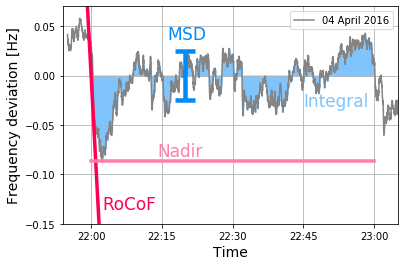

In [116]:
f = lambda x,a,b: a*x + b

fig,ax = plt.subplots(figsize=(6,4))

crocof = shap.plots.colors.red_rgb 
cnadir = shap.plots.colors.light_red_rgb
cintegral = shap.plots.colors.light_blue_rgb
cmsd = shap.plots.colors.blue_rgb
fcolor = shap.plots.colors.gray_rgb

############## Sketch of targets #################### 

ax.plot(np.arange(-5*60, 3601+5*60)/60, freq.loc[ind-pd.DateOffset(minutes=5):ind+pd.DateOffset(minutes=65)], c=fcolor, label='04 April 2016')
ax.grid()

# Rocof
smoothed_df_dt = freq.loc[ind-pd.DateOffset(minutes=60):ind+pd.DateOffset(minutes=60)].diff().rolling(60 , center=True).mean()
smoothed_df_dt=smoothed_df_dt.loc[ind-pd.DateOffset(minutes=1):ind+pd.DateOffset(minutes=1)]
arg_ext = np.argmax(smoothed_df_dt.abs().values)
rocof=smoothed_df_dt.iloc[arg_ext]
ax.plot(np.arange(-5*60, 5*60)/60,
        f(np.arange(-5*60, 5*60), rocof, 0),
        lw=3.5, c=crocof)
ax.annotate('RoCoF', [2.45,-0.135], color=crocof, fontsize=17)


#Nadir
nadir=freq.loc[ind-pd.DateOffset(minutes=5):ind+pd.DateOffset(minutes=60)].min()
ax.plot([0,60],[nadir,nadir], lw=3.5,  c=cnadir)
ax.annotate('Nadir', [14,-0.082], color=cnadir, fontsize=17)

#Integral
plt.fill_between(np.arange(0, 3601)/60,
                 np.zeros(3601),
                 freq.loc[ind:ind+pd.DateOffset(minutes=60)], 
                 color=cintegral)
plt.annotate('Integral', [45,-0.031], color=cintegral, fontsize=17)

#MSD
msd_val = (freq.loc[ind:ind+pd.DateOffset(minutes=60)]**2).mean()
ax.errorbar([20], [0], [np.sqrt(msd_val)],capsize=10, lw=4.5,capthick=4.5,color=cmsd, zorder=100)
ax.annotate(r'$\rm{MSD}$', [16,0.037], color=cmsd, fontsize=17)

ax.set_xlim([-6,65])
ax.set_ylim([-0.15,0.07])
ax.set_yticks([-0.15,-0.1,-0.05,0,0.05])
ax.set_xlabel('Time', fontsize=14)
ax.set_ylabel('Frequency deviation [Hz]', fontsize=14)
plt.legend()
plt.xticks([0,15,30,45,60], ['22:00', '22:15', '22:30', '22:45', '23:00'])

plt.savefig(figure_path+ 'sketch_of_targets.pdf', bbox_inches='tight')

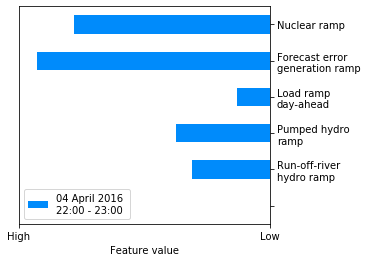

In [118]:
######### Sketch of features ###########

fig,ax = plt.subplots(figsize=(4.5,4))


important_features = ['nuclear_ramp', 'forecast_error_total_gen_ramp', 'load_ramp_day_ahead', 'pumped_hydro_ramp', 'run_off_hydro_ramp' , '']
feature_names = ['Nuclear ramp', 'Forecast error \ngeneration ramp', 'Load ramp \nday-ahead',  'Pumped hydro \nramp', 'Run-off-river \nhydro ramp','']

data = input_data.add(-input_data.min())
data = data.div(data.quantile(0.99))
data.loc[:,''] = 0
data.loc[ind, important_features[::-1]].rename('04 April 2016 \n22:00 - 23:00').plot.barh(ax=ax, color=shap.plots.colors.blue_rgb, legend=False)
plt.legend(loc='lower left')
ax.set_xlabel('Feature value')
ax.set_xticks([0,1])
ax.set_xticklabels(['Low', 'High'])
ax.set_yticklabels(feature_names[::-1])
ax.invert_xaxis()
ax.yaxis.tick_right()
plt.savefig(figure_path+'sketch_of_features.pdf', bbox_inches='tight')


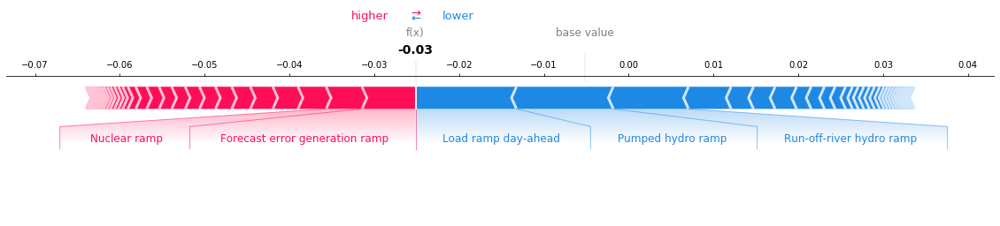

In [120]:
######## Sketch of SHAP #############
f=shap.force_plot(outputs.f_ext.mean(), shap_vals.values[np.argwhere(X_test.index==ind)[0,0]],  X_test.rename(columns=input_col_names).loc[ind].index,  matplotlib=True, show=False, figsize=(20,3))
plt.savefig(figure_path+'sketch_of_shap.svg', bbox_inches='tight')


# Figure 2

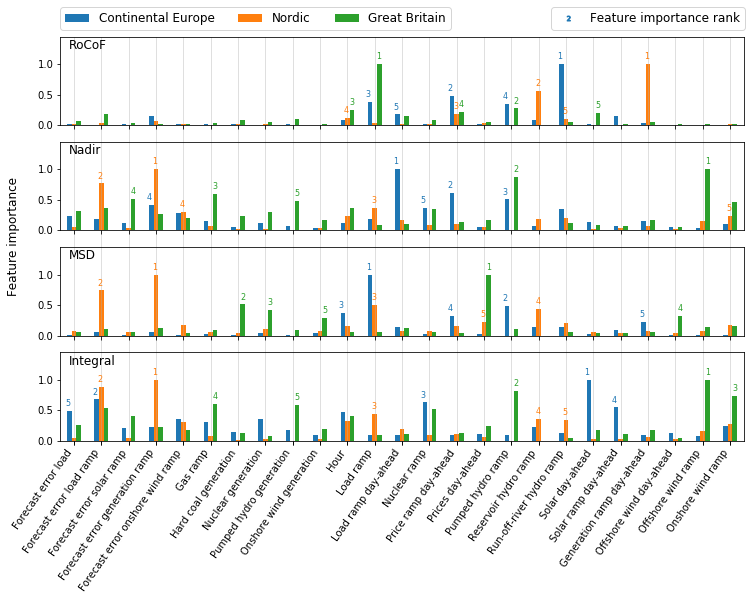

In [168]:
# Number of most important features included from each area and target
n_features= 5

# Setup
fig, axs = plt.subplots(4,1,figsize=(10.5,8.5))
shap_vals_abs=pd.DataFrame(index=input_cols, columns=pd.MultiIndex.from_product([targets,areas]))
important_features = []

# Create set of unique important features 
# (including n_features from ich area-target pair)
for i,targ in enumerate(targets):    
    for j,area in enumerate(areas):

        X_test = pd.read_hdf(version_folder.format(area, version)+'X_test_full.h5')

        shap_vals = np.load(fit_folder.format(area, version, targ)+ 'shap_values_gtb_full.npy')
        shap_vals = pd.DataFrame(data=shap_vals, index=X_test.index, columns=X_test.columns)
        
        shap_vals_abs.loc[:,(targ,area)] = shap_vals.abs().mean()
        
        important_features+= list(shap_vals.abs().mean().sort_values(ascending=False).iloc[:n_features].index)
        
important_features = np.unique(important_features)
shap_vals_abs = shap_vals_abs / shap_vals_abs.max()


# make feature importance bar plots
for i,targ in enumerate(targets):  
    shap_vals_abs.loc[important_features,targ].rename(columns=dict(zip(areas,area_names))).plot(kind='bar',ax=axs[i], legend=False, color=area_colors)
    
    axs[i].set_ylim([0,1.45])
    
    # annotate n_features most important features with their importance rank 
    for j,area in enumerate(areas):

        for m in range(n_features):
            feature_m = shap_vals_abs.loc[:,(targ, area)].sort_values(ascending=False).iloc[[m]]
            idx = np.argwhere(shap_vals_abs.loc[important_features].index==feature_m.index[0])[0,0]
            axs[i].annotate(m+1, (idx+0.07-(2-j)*0.2, feature_m.values+0.08), fontsize=8, c=area_colors[j])

    # add axis labels and legend
    if i!=3:
        axs[i].set_xticklabels('')
    if i==3:
        axs[i].set_xticklabels([input_col_names[feat] for feat in important_features], rotation=55, ha='right')
    if i==0:
        leg1 = axs[i].legend(bbox_to_anchor=(0.58,1.4), ncol=3,columnspacing=2, fontsize=12)
        annot_text = plt.plot(-10,0, marker=r'$2$', ms=5, lw=0,  c=area_colors[0])
        leg2 = axs[i].legend(annot_text, ['Feature importance rank'], bbox_to_anchor=(1.01,1.4), ncol=3,columnspacing=2, fontsize=12)
        axs[i].add_artist(leg1)
        
    # add target names    
    axs[i].grid(True, axis='x', alpha=0.5)
    axs[i].annotate(target_names[i], (-0.2,1.25), fontsize=12)

fig.text(0.02, 0.6, 'Feature importance', va='center', ha='center', rotation='vertical', fontsize=12)

#Add grid between the subplots
ax3 = fig.add_subplot(111, zorder=-1, sharex=axs[0])
for _, spine in ax3.spines.items():
    spine.set_visible(False)
ax3.tick_params(labelleft=False, labelbottom=False, left=False, right=False )
ax3.grid(axis="x", alpha=0.5)

plt.tight_layout()
plt.savefig(figure_path+'fig2.pdf', bbox_inches='tight')

# Figure 3

In [126]:
#### Inspect and select important generation ramps for the RoCoF ####

gen_ramps_importance = pd.DataFrame()

for i,area in enumerate(areas):
    shap_vals_act = np.load(fit_folder.format(area, version, 'f_rocof')+ 'shap_values_gtb_full.npy')
    X_test_act = pd.read_hdf(version_folder.format(area, version)+'X_test_full.h5')
    shap_vals_act = pd.DataFrame(index=X_test_act.index, columns=X_test_act.columns, data=shap_vals_act)
    
    area_gen_ramps_importance = shap_vals_act.abs().mean().div(shap_vals_act.abs().mean().max())
    area_gen_ramps_importance = area_gen_ramps_importance[X_test_act.filter(regex='^gen').columns.str[4:] + '_ramp']
    area_gen_ramps_importance.name= area
    gen_ramps_importance = pd.concat([gen_ramps_importance,area_gen_ramps_importance], axis=1,sort=True)

# Display generation ramps where all feature importances are above 0.01 
print(gen_ramps_importance.loc[~(gen_ramps_importance<0.01).any(axis=1)])

# Select dispatchable generation types based on feature importance
# (We only examine dispatchable generation types whose ramps have importances over 0.01 in all areas.
# Not included: 'coal_gas_ramp', 'other_ramp', 'other_renew_ramp', 'geothermal_ramp','oil_ramp','biomass_ramp','waste_ramp')
gen_ramps = np.array([
       'nuclear_ramp',  'pumped_hydro_ramp',
        'reservoir_hydro_ramp','gas_ramp', 'hard_coal_ramp',
        'lignite_ramp', 'fossil_peat_ramp'])
gen_ramp_names = np.array([ 
       'Nuclear',  'Pumped hydro',
        'Reservoir hydro','Gas',  'Hard coal',  'Lignite', 'Fossil peat'])


                            CE    Nordic        GB
fossil_peat_ramp           NaN  0.021731       NaN
hard_coal_ramp        0.092498  0.012745  0.041796
lignite_ramp          0.029006       NaN       NaN
nuclear_ramp          0.021607  0.012851  0.089979
pumped_hydro_ramp     0.350535       NaN  0.273113
reservoir_hydro_ramp  0.089609  0.560904       NaN
run_off_hydro_ramp    1.000000  0.104596  0.043902
solar_ramp            0.060369  0.015615  0.023556


In [127]:
#### Calculate relative ramping speeds and correlation of features and SHAP values ####

shap_corr = pd.DataFrame(index=areas, columns=gen_ramps)
rel_ramp_speed = pd.DataFrame(index=areas, columns=gen_ramps)
ramp_rate = pd.DataFrame(index=areas, columns=gen_ramps)
med_gen_ramp = pd.DataFrame(index=areas, columns=gen_ramps)

for i,area in enumerate(areas):

    # Load results and data
    shap_vals_act = np.load(fit_folder.format(area, version, 'f_rocof')+ 'shap_values_gtb_full.npy')
    X_test_act = pd.read_hdf(version_folder.format(area, version)+'X_test_full.h5')
    shap_vals_act = pd.DataFrame(index=X_test_act.index, columns=X_test_act.columns, data=shap_vals_act)
    inputs = pd.read_hdf(data_folder.format(area)+'input_actual.h5')
    
    # Define ramping rates
    ramp_rate.loc[area,'nuclear_ramp'] = 2/100
    ramp_rate.loc[area,'gas_ramp'] = 15/100  # 20 for OCGT or 8 for CCGT, so we take a value in between
    ramp_rate.loc[area,'pumped_hydro_ramp'] = 15/100 # same as for reservoir hydro
    ramp_rate.loc[area,'reservoir_hydro_ramp'] = 15/100
    ramp_rate.loc[area,'hard_coal_ramp'] = 6 /100
    ramp_rate.loc[area,'lignite_ramp'] = 4/100
    ramp_rate.loc[area,'fossil_peat_ramp'] = 8/100 
    
    for gen in gen_ramps:
        if gen in shap_vals_act.columns:

            # Determine correlation between SHAP and feature value
            shap_corr.loc[area,gen] = np.corrcoef(shap_vals_act.loc[:,gen].values,X_test_act.loc[:,gen].values)[1,0]

            # Detrmine median ramp 
            med_gen_ramp.loc[area,gen] = inputs.loc[:,gen].abs().median() 
            
# Calculate proxy for ramping speed
ramp_speed = ramp_rate*med_gen_ramp
rel_ramp_speed= (ramp_speed.T/ramp_speed.max(axis=1)).T
rel_ramp_speed = rel_ramp_speed.dropna(axis=1, how='all')


Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike
All-NaN slice encountered
This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


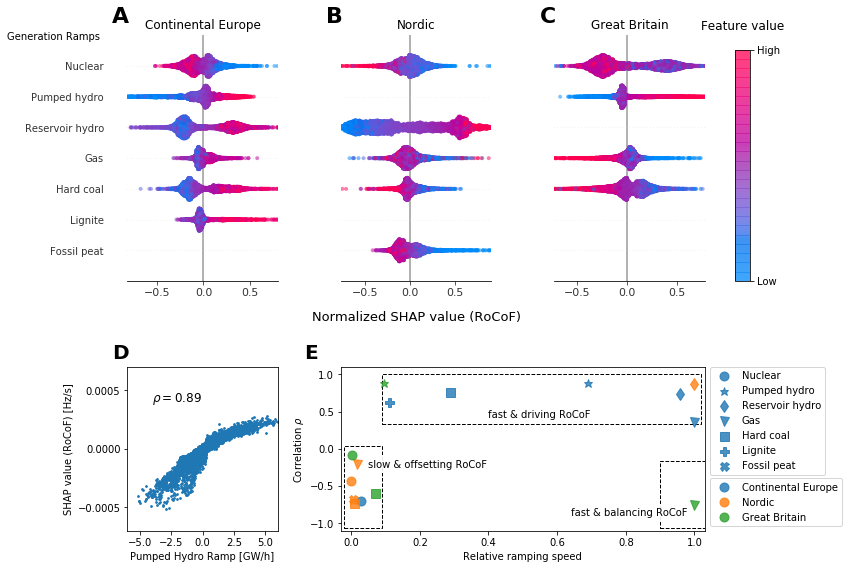

In [135]:
#### Plot for fig. 3 ####


markers = {
    'fossil_peat_ramp':'X',
    'nuclear_ramp':'o',
    'gas_ramp':'v',
    'pumped_hydro_ramp':'*',
    'reservoir_hydro_ramp':'d',
    'hard_coal_ramp':'s',
    'lignite_ramp':'P'
}

fig = plt.figure(figsize=(12.5,8.))
widths = [1,1,1]
heights = [1.5, 1]
spec = fig.add_gridspec(ncols=3, nrows=2, width_ratios=widths, height_ratios=heights)


#### Summary plot for generation ramp SHAP values ####

for i,area in enumerate(areas):
    
    shap_vals = np.load(fit_folder.format(area, version, 'f_rocof')+ 'shap_values_gtb_full.npy')
    X_test = pd.read_hdf(version_folder.format(area, version)+'X_test_full.h5')
    shap_vals = pd.DataFrame(index=X_test.index, columns=X_test.columns, data=shap_vals)
    
    shap_vals_range = shap_vals.abs().max() 
    ax=fig.add_subplot(spec[0,i])
    plt.subplot(ax)
    shap.summary_plot(shap_vals.div(shap_vals_range).loc[:,gen_ramps].values,X_test.loc[:,gen_ramps],
                      color_bar=False, show=False, plot_size=None, sort=False, alpha=0.5)
    xmax = shap_vals.div(shap_vals_range).loc[:,gen_ramps].stack().quantile(0.999)
    xmin= shap_vals.div(shap_vals_range).loc[:,gen_ramps].stack().quantile(0.001)
    plt.xlim([xmin, xmax])
    plt.xlabel('')
    if i!=0:
        plt.yticks([])
    if i==1:
        plt.xlabel('Normalized SHAP value (RoCoF)', labelpad=13)
    if i==0:
        plt.annotate('Generation Ramps',(-0.8,0.98), rotation=0, xycoords='axes fraction')
        ax.set_yticklabels(gen_ramp_names[::-1], fontsize=10)
    plt.annotate(['A','B','C'][i], (-0.1,1.05), fontweight='bold', xycoords='axes fraction', fontsize=22)
    plt.title(area_names[i])
    
cax = inset_axes(ax,  width="10%",  
                 height="94%",  
                 loc='lower left',
                 bbox_to_anchor=(1.2, 0., 1, 1),
                 bbox_transform=ax.transAxes,
                 borderpad=0 )
cbar=plt.colorbar(ax=ax, cax=cax)
cbar.ax.set_title('Feature value', pad=20)
cbar.set_ticks([cbar.vmin, cbar.vmax])
cbar.ax.set_yticklabels(['Low', 'High'])

### Example dependency plot #####

ax=fig.add_subplot(spec[1,0])

ex_feature = 'pumped_hydro_ramp'
X_test = pd.read_hdf(version_folder.format('CE', version)+'X_test_full.h5')
X_test = X_test.mul(input_rescale_factors.reindex(X_test.columns))
shap_vals = np.load(fit_folder.format('CE', version, 'f_rocof')+ 'shap_values_gtb_full.npy')
shap_vals = pd.DataFrame(index=X_test.index, columns=X_test.columns, data=shap_vals)
ax.scatter(X_test.loc[:,ex_feature], shap_vals.loc[:,ex_feature], c=[area_colors[0]], s=3)
ax.set_xlabel('Pumped Hydro Ramp [GW/h]')
ax.set_ylabel('SHAP value (RoCoF) [Hz/s]')
ax.set_ylim([-0.0007,0.0007])
ax.set_xlim([-6,6])
#ax.set_xticks([-5000,5000])
#ax.set_xticklabels(['Low', 'High'])
ax.annotate(r'$\rho=${:.2}'.format(shap_corr.loc['CE',ex_feature]), (-4, 0.0004), fontsize=12)#ax.annotate(r'$\rho=${:.2}'.format(shap_corr.loc['CE',ex_feature]), (-4000, 0.0004), fontsize=12)
plt.locator_params(axis='y', nbins=3)
plt.annotate('D', (-0.1,1.05), fontweight='bold', xycoords='axes fraction', fontsize=20)

#### Correlation vs. relative ramping speed plot #####

ax=fig.add_subplot(spec[1,1:])
points = []
for c,area in zip(area_colors,areas):
    for i,gen in enumerate(rel_ramp_speed.columns):
        p = ax.plot(rel_ramp_speed.loc[area,gen],shap_corr.loc[area,gen], marker=markers[gen],label=dict(zip(gen_ramps, gen_ramp_names))[gen], c=c, ms=9, alpha=0.8, lw=0)
        if i==0:
            points+= p
    if area=='CE':
        leg1 = ax.legend(bbox_to_anchor=(1,1.03))
ax.set_ylim([-1.1,1.1])
ax.set_xlim([-0.03,1.03])
leg2 = ax.legend(points, area_names, bbox_to_anchor=(1,0.35))
ax.add_artist(leg1)

rect = mpl.patches.Rectangle((0.09,.33),0.93,0.68,linewidth=1,edgecolor='k',ls='--',facecolor='none')
ax.add_patch(rect)
rect = mpl.patches.Rectangle((-0.02,-1.06),0.11,1.1,linewidth=1,edgecolor='k',ls='--',facecolor='none')
ax.add_patch(rect)
rect = mpl.patches.Rectangle((0.9,-1.06),0.13,0.9,linewidth=1,edgecolor='k',ls='--',facecolor='none')
ax.add_patch(rect)

plt.annotate('E', (-0.1,1.05), fontweight='bold', xycoords='axes fraction', fontsize=20)
ax.annotate('fast & driving RoCoF', (0.4,0.42), bbox={'facecolor':'w', 'alpha':0.9, 'lw':0}) 
ax.annotate('slow & offsetting RoCoF', (0.05,-0.25), bbox={'facecolor':'w', 'alpha':0.9, 'lw':0})
ax.annotate('fast & balancing RoCoF', (0.64,-0.9), bbox={'facecolor':'w', 'alpha':0.9, 'lw':0})
plt.ylabel(r'Correlation $\rho$')
plt.xlabel('Relative ramping speed')

plt.tight_layout(h_pad=2)
plt.savefig(figure_path+'fig3.pdf', bbox_inches='tight')

# Figure 4

In [136]:
#### Select unique most important features for daily SHAP values of MSD ####

targ = 'f_msd' 
selected_weekdays = [0,1,2,3,4,5,6] # select all weekdays!
max_select=3 
shap_vals_daily_profile = dict(keys=areas)
most_important_features = pd.Index([])

for i,area in enumerate(areas):
    
    shap_vals = np.load(fit_folder.format(area, version, targ)+ 'shap_values_gtb_full.npy')
    X_test = pd.read_hdf(version_folder.format(area, version)+'X_test_full.h5')

    mask= X_test.index.weekday.isin(selected_weekdays)

    shap_vals_selected = pd.DataFrame(index=X_test.index, columns=X_test.columns, data=shap_vals).loc[mask]
    shap_vals_daily_profile[area] = shap_vals_selected.groupby(shap_vals_selected.index.hour).mean() 

    # Join max_select most important daily profile features for each area
    most_important_features = most_important_features.union(shap_vals_daily_profile[area].abs().sum().sort_values().iloc[-max_select:].index)
                                 
n_features = most_important_features.shape[0] + 1    
n_features # Number of unique features that will be displayed

9

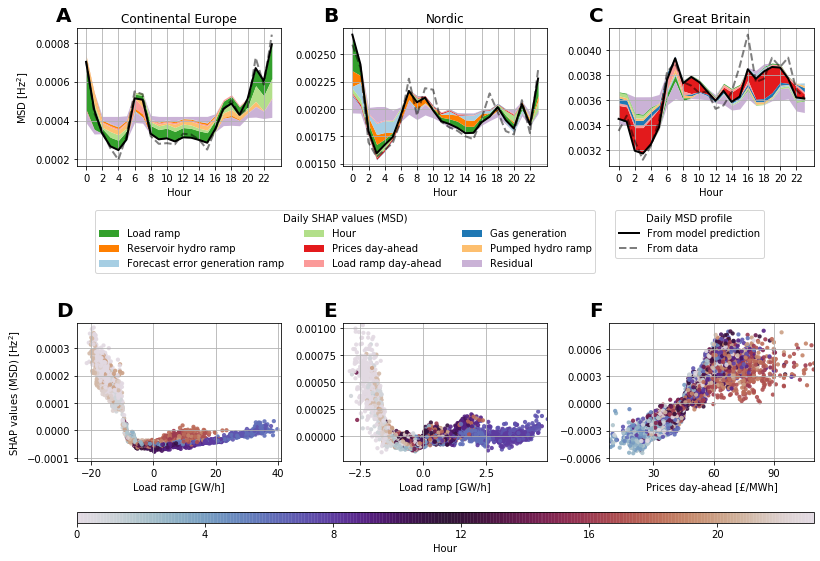

In [137]:
#### Plot for fig. 4 #####

fig, ax = plt.subplots(2,3, figsize=(11.5,9))
fcolors = dict( zip(most_important_features.to_list() + ['residual'], sns.color_palette("Paired", n_features) ))

for j,area in enumerate(areas):
    
    # load data
    y_pred = pd.read_hdf(fit_folder.format(area, version, targ)+'y_pred.h5')
    y_test =  pd.read_hdf(version_folder.format(area, version)+'y_test.h5').loc[:,targ]
    shap_vals = np.load(fit_folder.format(area, version, targ)+ 'shap_values_gtb_full.npy')
    X_test = pd.read_hdf(version_folder.format(area, version)+'X_test_full.h5')
    X_test = X_test.mul(input_rescale_factors.reindex(X_test.columns))

    # calculate base value for SHAP explanations
    base_value = y_pred.gtb_full.mean()
    
    # Calculate daily profile (from data) and daily SHAP values for selected most important features
    mask= X_test.index.weekday.isin(selected_weekdays)
    daily_profile = y_test.loc[mask].groupby(y_test.loc[mask].index.hour).mean()
    shap_vals_daily_profile_selected = shap_vals_daily_profile[area].reindex(columns=most_important_features)
    shap_vals_daily_profile_selected = shap_vals_daily_profile_selected.loc[:, shap_vals_daily_profile_selected.abs().sum().sort_values().index[::-1]]
    shap_vals_daily_profile_selected.loc[:,'residual'] = shap_vals_daily_profile[area].drop(columns=most_important_features,errors='ignore').sum(1)
    

    # Split into positive and negative daily SHAP values
    posvals = shap_vals_daily_profile_selected.where(shap_vals_daily_profile_selected<0, 0)
    negvals = shap_vals_daily_profile_selected.where(shap_vals_daily_profile_selected>0, 0)

    l1=ax[0,j].plot(np.arange(24),base_value + shap_vals_daily_profile_selected.sum(1), lw=2, c='k')
    l2=ax[0,j].plot(np.arange(24),daily_profile, '--', lw=2,alpha=0.5, c='k')

    # Plot positive shap values
    baseline = shap_vals_daily_profile_selected.sum(axis=1) + base_value
    for i,col in enumerate(shap_vals_daily_profile_selected.columns):
        ax[0,j].fill_between(np.arange(24), baseline, baseline- posvals.iloc[:,i],
                         color=fcolors[col], lw=0)
        baseline=baseline-posvals.iloc[:,i]

    # Plot negative shap values
    baseline = shap_vals_daily_profile_selected.sum(axis=1) + base_value
    for i,col in enumerate(shap_vals_daily_profile_selected.columns):
        ax[0,j].fill_between(np.arange(24), baseline, baseline- negvals.iloc[:,i],
                          color=fcolors[col], lw=0,
                         label=input_col_names[negvals.iloc[:,i].name])
        baseline=baseline-negvals.iloc[:,i]
    
    ax[0,j].set_xticks(np.arange(24)[::2])
    ax[0,j].grid()
    ax[0,j].set_xlabel('Hour')
    ax[0,j].set_title(area_names[j])

    # plot dependency plot for most important daily SHAP values
    most_important_daily_feature = shap_vals_daily_profile_selected.columns[0]
    ind = np.argwhere(X_test.columns==most_important_daily_feature)[0,0]
    im=ax[1,j].scatter(X_test.loc[:,most_important_daily_feature],
                    shap_vals[:,ind],
                    s=18, alpha=0.9,lw=0, c=X_test.hour, cmap='twilight', rasterized=True)
    
    xlower = X_test.loc[:,most_important_daily_feature].quantile(0.005)
    xupper =  X_test.loc[:,most_important_daily_feature].quantile(0.995)
    ylower = pd.Series(shap_vals[:,ind]).quantile(0.001)
    yupper =  pd.Series(shap_vals[:,ind]).quantile(0.999)

    ax[1,j].set_xlim([xlower-np.abs(xupper-xlower)*0.1,xupper+np.abs(xupper-xlower)*0.1])
    ax[1,j].set_ylim([ylower-np.abs(yupper-ylower)*0.1,yupper+np.abs(yupper-ylower)*0.1])
    
    ax[1,j].set_xlabel(input_col_names_units[most_important_daily_feature])
    ax[1,j].grid()
    ax[1,j].xaxis.set_major_locator(plt.MaxNLocator(4))
    ax[1,j].yaxis.set_major_locator(plt.MaxNLocator(6))
    
ax[1,0].set_ylabel('SHAP values (MSD) [Hz$^2$]')
ax[0,0].set_ylabel('MSD [Hz$^2$]')

# subplot annotation 
for i,ax_i in enumerate(ax.flatten()):
    ax_i.annotate(['A','B','C','D','E','F'][i], (-0.1,1.05), fontweight='bold', xycoords='axes fraction', fontsize=20)

plt.tight_layout(h_pad=15)

# legends
leg1=ax[0,1].legend(bbox_to_anchor=(1.26,- 0.28,0,0), title='Daily SHAP values (MSD)', ncol=3)
leg2=ax[0,2].legend(l1+l2,['From model prediction', 'From data'],bbox_to_anchor=(0.78,- 0.28,0,0), title='Daily MSD profile')
cbar = fig.colorbar(im, ax=ax,orientation='horizontal', aspect=70, pad=0.09, label='Hour',ticks = np.arange(0,24,4))

plt.savefig(figure_path+'fig4.pdf', bbox_inches='tight', dpi=220)

# Figure 5

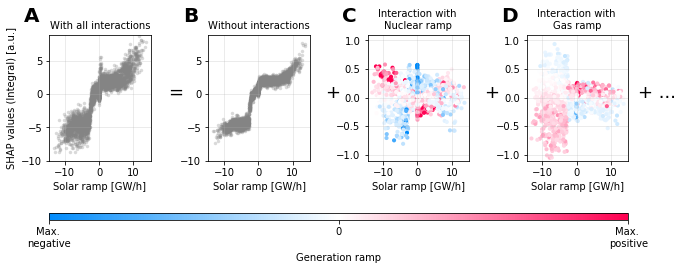

In [139]:
fig , ax = plt.subplots(1,5, figsize=(10,4), gridspec_kw=dict(width_ratios=[1,1,1,1,0.1]))
targ = 'f_integral'
area='CE'

shap_inter_vals = np.load(fit_folder.format(area, version, targ)+ 'shap_interaction_values_gtb_full.npy')
shap_vals = np.load(fit_folder.format(area, version, targ)+ 'shap_values_gtb_full.npy')
X_test = pd.read_hdf(version_folder.format(area, version)+'X_test_full.h5')
X_test = X_test.mul(input_rescale_factors.reindex(X_test.columns))

# SHAP values
name = 'solar_ramp'
ind = np.argwhere(X_test.columns==name)[0,0]
ax[0].scatter(X_test.loc[:,name],shap_vals[:,ind],s=12, alpha=0.3,lw=0, c=[shap.plots.colors.gray_rgb], rasterized=True)
ax[0].set_xlabel(input_col_names_units[name])
ax[0].set_ylim([-10,9])
ax[0].set_ylabel('SHAP values (Integral) [a.u.]')
ax[0].set_title('With all interactions', fontsize=10)

# Diagonal SHAP interaction values
name2 = 'solar_ramp'
name1 = 'solar_ramp'
ind1 = np.argwhere(X_test.columns==name1)[0,0]
ind2 = np.argwhere(X_test.columns==name2)[0,0]
ax[1].scatter(X_test.loc[:,name1], shap_inter_vals[:,ind1,ind2],s=12, alpha=0.3,lw=0, c=[shap.plots.colors.gray_rgb], rasterized=True)
ax[1].set_xlabel(input_col_names_units[name1])
ax[1].set_ylim([-10,9])
ax[1].set_title('Without interactions', fontsize=10)

# Shap interaction with nuclear ramp
name2 = 'nuclear_ramp'
name1 = 'solar_ramp'
ind1 = np.argwhere(X_test.columns==name1)[0,0]
ind2 = np.argwhere(X_test.columns==name2)[0,0]
cdata = X_test.loc[:,name2] / X_test.loc[:,name2].quantile(0.99)
ax[2].scatter(X_test.loc[:,name1], shap_inter_vals[:,ind1,ind2],s=17, alpha=1,lw=0, c=cdata, vmin=-1, vmax=1, cmap=shap.plots.colors.red_white_blue, rasterized=True)
ax[2].set_xlabel(input_col_names_units[name1])
ax[2].set_ylim([-1.1,1.1])
ax[2].set_title('Interaction with \nNuclear ramp', fontsize=10)

# Shap interaction with gas ramp
name2 = 'gas_ramp'
name1 = 'solar_ramp'
ind1 = np.argwhere(X_test.columns==name1)[0,0]
ind2 = np.argwhere(X_test.columns==name2)[0,0]
cdata = X_test.loc[:,name2] / X_test.loc[:,name2].quantile(0.99)
im=ax[3].scatter(X_test.loc[:,name1], shap_inter_vals[:,ind1,ind2],s=17, alpha=1,lw=0, c=cdata, vmin=-1, vmax=1, cmap=shap.plots.colors.red_white_blue, rasterized=True)
ax[3].set_xlabel(input_col_names_units[name1])
ax[3].set_ylim([-1.1,1.1])
ax[3].set_title('Interaction with \nGas ramp', fontsize=10)

ax[4].set_visible(False)
plt.tight_layout(w_pad=2)

# Annotations
for i,ax_i in enumerate(ax[:-1]):
    ax_i.annotate(['A','B','C','D'][i], (-0.25,1.1), fontweight='bold', xycoords='axes fraction', fontsize=20)
    
ax[1].annotate('=', (-0.4,0.5), xycoords='axes fraction', fontsize=18)
ax[2].annotate('+', (-0.42,0.5), xycoords='axes fraction', fontsize=18)
ax[3].annotate('+', (-0.42,0.5), xycoords='axes fraction', fontsize=18)
ax[3].annotate('+ ...', (1.1,0.5), xycoords='axes fraction', fontsize=18)

for ax_i in ax:
    ax_i.grid(alpha=0.3)
    
cbar=fig.colorbar(im, ax=ax[:-1], orientation='horizontal', aspect=80, label='Generation ramp', ticks=[-1,0,1], pad=0.25)
cbar.ax.set_xticklabels(['Max. \nnegative', '0', 'Max. \npositive']) 

plt.savefig(figure_path+'fig5.pdf', bbox_inches='tight', dpi=220)

# Supplementary material

In [4]:
folder = '../data/{}/'
doc_folder = folder + 'documentation_of_data_download/'

## External feature aggregation and data cleansing

### Figure S1

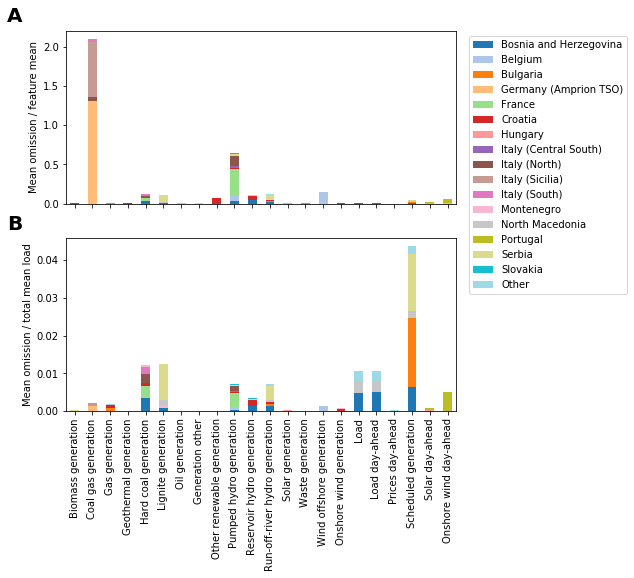

In [7]:
area='CE'
omitted_contribs = pd.read_csv(doc_folder.format(area)+'omitted_contributions.csv')
region_names = {'BA CTY':'Bosnia and Herzegovina', 'BE CTY':'Belgium', 'BG CTY':'Bulgaria', 'CH CTY':'Switzerland',
                'DE(Amprion) CTA':'Germany (Amprion TSO)', 'FR CTY':'France',
                'HU CTY':'Hungary', 'IT-Centre-South BZN':'Italy (Central South)', 'IT-North BZN':'Italy (North)',
                'IT-Sicily BZN':'Italy (Sicilia)', 'IT-South BZN':'Italy (South)',
                'ME CTY':'Montenegro', 'MK CTY':'North Macedonia', 'NL CTY':'Netherlands', 'PL CTY':'Poland',
                'PT CTY':'Portugal', 'RO CTY':'Romania', 'RS CTY':'Serbia', 'SK CTY':'Slovakia', 'Other':'Other',
                'HR CTY': 'Croatia'}

ratio_var = omitted_contribs.pivot(index='variable', columns='region', values='ratio_var')
ratio_load = omitted_contribs.pivot(index='variable', columns='region', values='ratio_load')

ratio_var = ratio_var.rename(index=input_col_names)
ratio_load = ratio_load.rename(index=input_col_names)


thresh = 0.008
ratio_load_final = ratio_load.loc[:,ratio_var.sum()>thresh].copy()
ratio_var_final = ratio_var.loc[:,ratio_var.sum()>thresh].copy()

ratio_load_final.loc[:, 'Other'] = ratio_load.loc[:,ratio_var.sum()<thresh].sum(1)
ratio_var_final.loc[:,'Other'] = ratio_var.loc[:,ratio_var.sum()<thresh].sum(1)
ratio_var_final.rename(columns=region_names, inplace=True)
ratio_load_final.rename(columns=region_names, inplace=True)

fig,ax=plt.subplots(2,1, figsize=(7,7))


ratio_var_final.plot.bar(stacked=True, legend=False, cmap='tab20', ax=ax[0])
ax[0].xaxis.set_ticklabels([])
ax[0].set_xlabel('')
ax[0].set_ylabel('Mean omission / feature mean')
ax[0].legend(bbox_to_anchor=(0.95,0.5,0.5,0.5))


ratio_load_final.plot.bar(stacked=True, legend=False, cmap='tab20', ax=ax[1])
ax[1].set_xlabel('')
ax[1].set_ylabel('Mean omission / total mean load')

for i,ax_i in enumerate(ax.flatten()):
    ax_i.annotate(['A','B'][i], (-0.15,1.05), fontweight='bold', xycoords='axes fraction', fontsize=20)
    
plt.savefig(figure_path+'fig_supp1.pdf', bbox_inches='tight')

### Figure S2

In [142]:
inds_gen = pd.Index([])
inds_other  = pd.Index([])

for i,area in enumerate(areas):

    raw_input_data = pd.read_hdf(folder.format(area) + 'raw_input_data.h5')
    inds_gen = inds_gen.union(raw_input_data.filter(regex='^gen').columns)
    
    inds_other = inds_other.union(raw_input_data.drop(columns=raw_input_data.filter(regex='^gen').columns).columns)
    

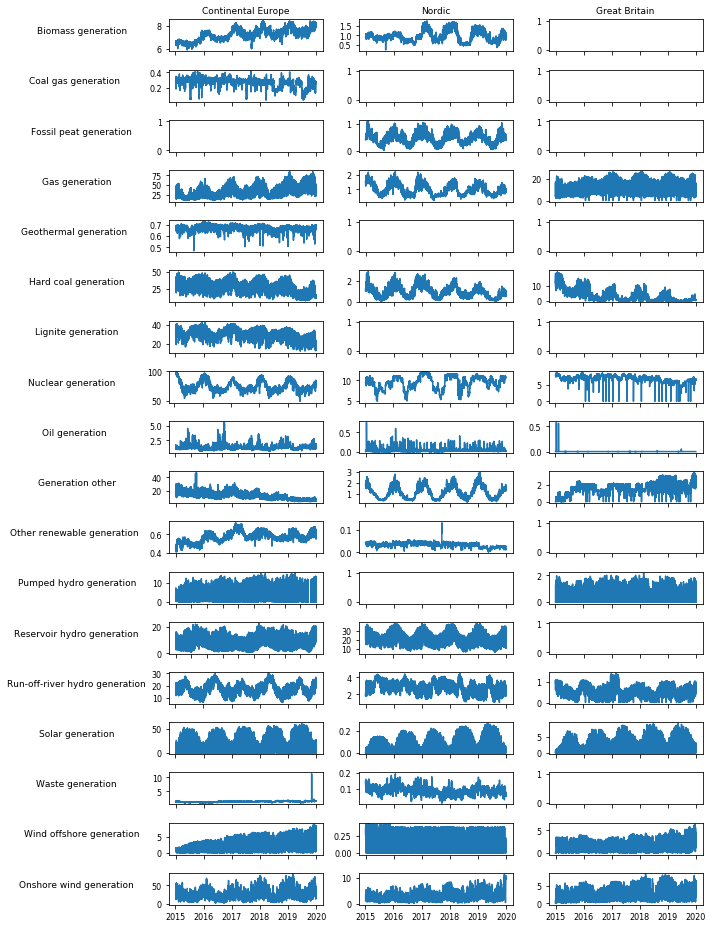

In [143]:
fig, ax = plt.subplots(inds_gen.shape[0], 3, figsize=(10,13))

for j, area in enumerate(areas):
    
    raw_input_data = pd.read_hdf(folder.format(area) + 'raw_input_data.h5')
    raw_input_data = raw_input_data.mul(input_rescale_factors.reindex(raw_input_data.columns))
    
    ax[0,j].set_title(area_names[j], fontsize=9)
    
    for i, ind in enumerate(inds_gen):
        
        if ind in raw_input_data.columns:
            ax[i,j].plot(raw_input_data.loc[:,ind])
        else:
            ax[i,j].plot([])
        
        if j==0:
            ax[i,j].set_ylabel(input_col_names[ind], fontsize=9,rotation=0, labelpad=75)
            
        ax[i,j].tick_params(axis='both' ,labelsize=8)
        
        if i!=(inds_gen.shape[0]-1):
            ax[i,j].set_xticklabels([])
            
plt.tight_layout()

plt.savefig(figure_path+'fig_supp2.pdf', dpi=100)

### Figure S3

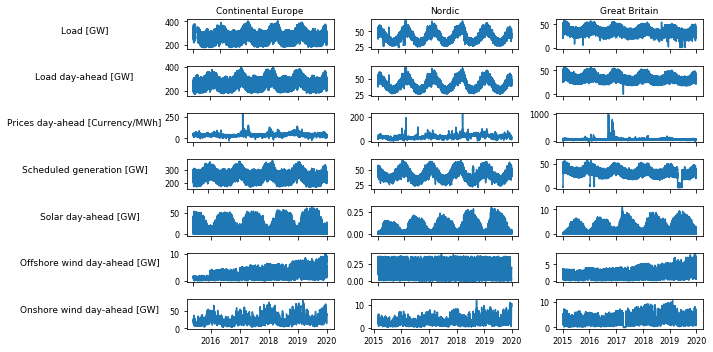

In [144]:
fig, ax = plt.subplots(inds_other.shape[0], 3, figsize=(10,5))

for j, area in enumerate(areas):
    
    raw_input_data = pd.read_hdf(folder.format(area) + 'raw_input_data.h5')
    raw_input_data = raw_input_data.mul(input_rescale_factors.reindex(raw_input_data.columns))
    
    ax[0,j].set_title(area_names[j], fontsize=9)
    
    for i, ind in enumerate(inds_other):
        
        if ind in raw_input_data.columns:
            ax[i,j].plot(raw_input_data.loc[:,ind])
        else:
            ax[i,j].plot([])
        
        if j==0:
            ax[i,j].set_ylabel(input_col_names_units_general[ind], fontsize=9,rotation=0, labelpad=80)
        
        if i!=(inds_other.shape[0]-1):
            ax[i,j].set_xticklabels([])
            
        ax[i,j].tick_params(axis='both' ,labelsize=8)
            
plt.tight_layout()

plt.savefig(figure_path+'fig_supp3.pdf', dpi=100)

### Table S1

In [145]:
# Make a latex table for all 66 features (as preperation of table S1)
ind = pd.Index([])
for i,area in enumerate(['CE', 'Nordic', 'GB']):

    X_test = pd.read_hdf(version_folder.format(area, version)+'X_test_full.h5')
    ind = ind.union(X_test.columns)

all_features=pd.Series(input_col_names_units_general).iloc[:-1].to_frame().reset_index()
all_features.index = np.arange(1,67)
all_features.columns=['Short name','Long name']
print(all_features.to_latex(longtable=True))

\begin{longtable}{lll}
\toprule
{} &                     Short name &                                 Long name \\
\midrule
\endhead
\midrule
\multicolumn{3}{r}{{Continued on next page}} \\
\midrule
\endfoot

\bottomrule
\endlastfoot
1  &                      gen\_other &                     Generation other [GW] \\
2  &                      gen\_solar &                     Solar generation [GW] \\
3  &                    gen\_wind\_on &              Onshore wind generation [GW] \\
4  &                      gen\_waste &                     Waste generation [GW] \\
5  &                    gen\_nuclear &                   Nuclear generation [GW] \\
6  &                    gen\_biomass &                   Biomass generation [GW] \\
7  &                        gen\_gas &                       Gas generation [GW] \\
8  &              gen\_run\_off\_hydro &       Run-off-river hydro generation [GW] \\
9  &                        gen\_oil &                       Oil generation [GW] \\
10 &   

### Table S2

In [146]:
for i,area in enumerate(['CE', 'Nordic', 'GB']):
    X_test = pd.read_hdf(version_folder.format(area, version)+'X_test_full.h5')
    X_train = pd.read_hdf(version_folder.format(area, version)+'X_train_full.h5')
    print(area, X_test.append(X_train).shape)

CE (26857, 64)
Nordic (37154, 58)
GB (43240, 50)


## RoCoF extraction

### Figure S4

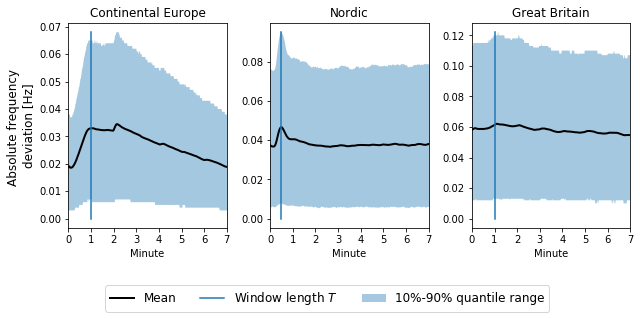

In [147]:
plt.figure(figsize=(9,3.8))
ts = np.arange(3600)/60
plt.subplot(1,3,1)

area='CE'
freq = -50 + pd.read_hdf('../../Frequency_data_preparation/{}'.format(files[area])).loc['2018-01-01':'2018-12-31']

gb = freq.abs().groupby(freq.index.minute*60+freq.index.second)
hourly_quantiles = gb.quantile(0.1).to_frame(0.1)
hourly_quantiles.loc[:,0.9]=gb.quantile(0.9)
hourly_mean = gb.mean()

L=60 
plt.fill_between(ts, hourly_quantiles.loc[:,0.1], hourly_quantiles.loc[:,0.9], alpha=0.4)
plt.plot(ts, hourly_mean, c='k', lw=2)
plt.plot([L/60, L/60], [0, hourly_quantiles.loc[:,0.9].max()])
plt.xlim([0,7])
plt.title('{}'.format(area_names[0]))
plt.xlabel('Minute')
plt.ylabel('Absolute frequency \ndeviation [Hz]', fontsize=12)
plt.xticks([0,1,2,3,4,5,6,7])

plt.subplot(1,3,2)
area='Nordic'
freq = -50 + pd.read_hdf('../../Frequency_data_preparation/{}'.format(files[area])).loc['2018-01-01':'2018-12-31']

gb = freq.abs().groupby(freq.index.minute*60+freq.index.second)
hourly_quantiles = gb.quantile(0.1).to_frame(0.1)
hourly_quantiles.loc[:,0.9]=gb.quantile(0.9)
hourly_mean = gb.mean()

L=30
plt.fill_between(ts, hourly_quantiles.loc[:,0.1], hourly_quantiles.loc[:,0.9], alpha=0.4, label='10%-90% quantile range')
plt.plot(ts, hourly_mean, c='k', lw=2, label='Mean')
plt.plot([L/60, L/60], [0, hourly_quantiles.loc[:,0.9].max()],
         label=r'Window length $T$')
plt.xlim([0,7])
plt.title('{}'.format(area_names[1]))
plt.xlabel('Minute')
ax = plt.gca()
plt.xticks([0,1,2,3,4,5,6,7])

plt.subplot(1,3,3)
area='GB'
freq = -50 + pd.read_hdf('../../Frequency_data_preparation/{}'.format(files[area])).loc['2018-01-01':'2018-12-31']

gb = freq.abs().groupby(freq.index.minute*60+freq.index.second)
hourly_quantiles = gb.quantile(0.1).to_frame(0.1)
hourly_quantiles.loc[:,0.9]=gb.quantile(0.9)
hourly_mean = gb.mean()

L=60 
plt.fill_between(ts, hourly_quantiles.loc[:,0.1], hourly_quantiles.loc[:,0.9], alpha=0.4)
plt.plot(ts, hourly_mean, c='k', lw=2)
plt.plot([L/60, L/60], [0, hourly_quantiles.loc[:,0.9].max()])
plt.xlim([0,7])
plt.title('{}'.format(area_names[2]))
plt.xlabel('Minute')
plt.xticks([0,1,2,3,4,5,6,7])

plt.tight_layout()
ax.legend(bbox_to_anchor=(1.8,-0.25), ncol=3, fontsize=12)

plt.savefig(figure_path+'fig_supp4.pdf', bbox_inches='tight')

### Basic data analysis

### Figure S5


Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike
This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


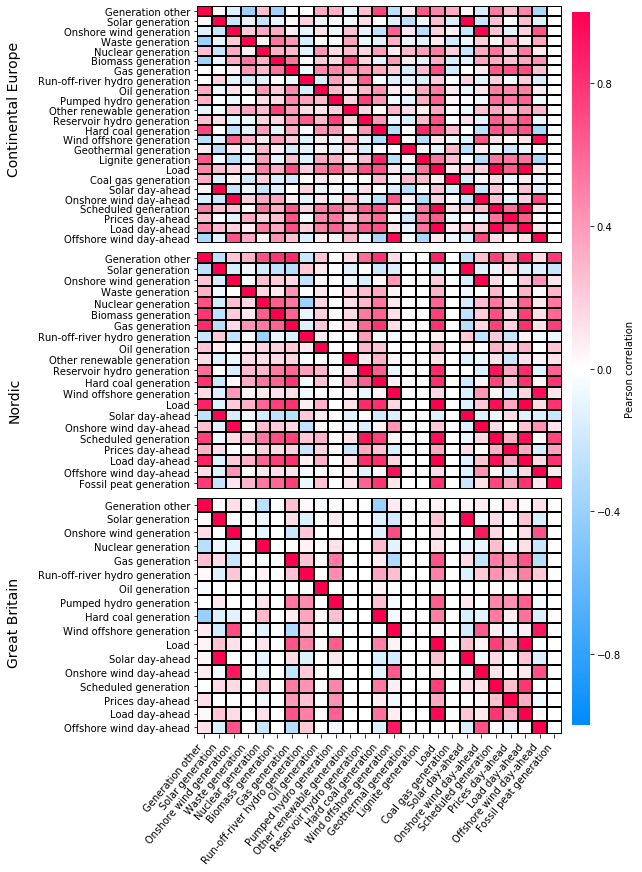

In [148]:
fig, axs= plt.subplots(3,1, figsize=(8,12.3))

raw_features = ['gen_other', 'gen_solar', 'gen_wind_on', 'gen_waste', 'gen_nuclear', 'gen_biomass', 'gen_gas', 'gen_run_off_hydro',
                'gen_oil', 'gen_pumped_hydro', 'gen_other_renew', 'gen_reservoir_hydro', 'gen_hard_coal', 'gen_wind_off',
                'gen_geothermal', 'gen_lignite', 'load', 'gen_coal_gas', 'solar_day_ahead', 'wind_on_day_ahead', 'scheduled_gen_total',
                'prices_day_ahead', 'load_day_ahead', 'wind_off_day_ahead',  'gen_fossil_peat']

corr_pearson = {'CE':[],'Nordic':[], 'GB':[]}
vmax = 0
cbar_ax = fig.add_axes([1, .17, .03, .805])
for i,(ax,area) in enumerate(zip(axs, areas)):

    input_actual = pd.read_hdf(data_folder.format(area)+'input_actual.h5')
    input_forecast = pd.read_hdf(data_folder.format(area)+'input_forecast.h5')

    data = pd.concat([input_actual, input_forecast], axis=1)
    corr_pearson[area] = data.loc[:,raw_features].corr().reindex(index=raw_features, columns=raw_features)


    vmax = np.amax([vmax, corr_pearson[area].abs().max().max()])

for i,(ax,area) in enumerate(zip(axs, areas)):
    

    corr_pearson_area = corr_pearson[area].drop(index=corr_pearson[area].index[corr_pearson[area].isnull().all(1)])
    corr_pearson_area.rename(index=input_col_names, columns=input_col_names, inplace=True)
    

    sns.heatmap(corr_pearson_area, xticklabels=(i==2), yticklabels=True, linecolor='black',linewidth=1,
                cmap=shap.plots.colors.red_white_blue, vmin=-vmax, vmax=vmax, ax=ax, cbar=(i==1), linewidths=1, cbar_kws={'aspect':10, 'pad':0.1, 'label':'Pearson correlation'},
                cbar_ax=None if i!=1 else cbar_ax)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=50, ha='right')
    ax.annotate(str(area_names[i]), (-190,70), fontsize=14, zorder=1, rotation=90,xycoords='axes points')
    
plt.tight_layout(h_pad=0.7)
plt.savefig(figure_path+'fig_supp5.pdf', bbox_inches='tight')

### Figure S6

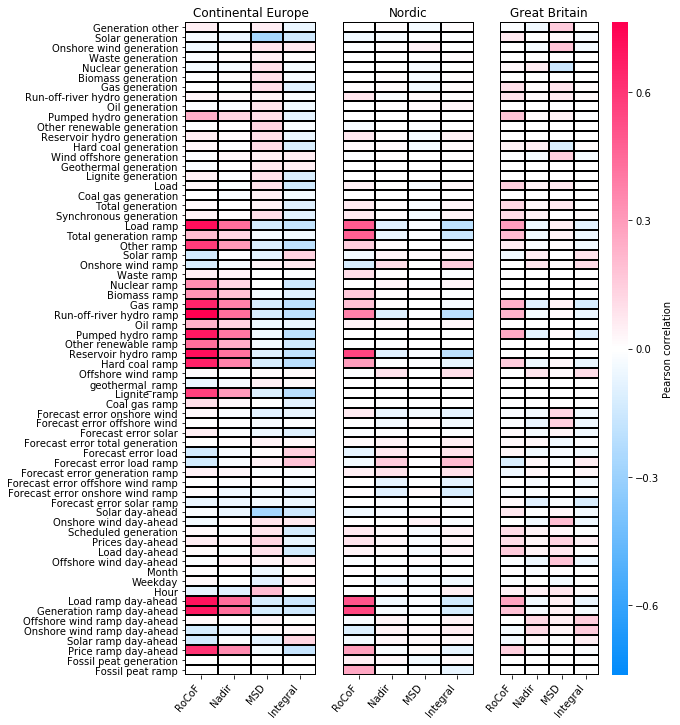

In [149]:
fig, axs= plt.subplots(1,3, figsize=(8,12))

vmax = 0
corr_pearson = {'CE':[],'Nordic':[], 'GB':[]}

for i,(ax,area) in enumerate(zip(axs, areas)):
    
    input_actual = pd.read_hdf(data_folder.format(area)+'input_actual.h5')
    input_forecast = pd.read_hdf(data_folder.format(area)+'input_forecast.h5')
    outputs = pd.read_hdf(data_folder.format(area)+'outputs.h5')

    data = pd.concat([input_actual, input_forecast, outputs], axis=1)
    corr_pearson[area] = data.corr()
    corr_pearson[area] = corr_pearson[area].reindex(index=list(input_col_names.keys())[:-1],
                                                     columns=targets)

    vmax = np.amax([vmax, corr_pearson[area].abs().max().max()])

for i,(ax,area) in enumerate(zip(axs, areas)):
    

    corr_pearson_area =  corr_pearson[area].rename(index=input_col_names)
    corr_pearson_area.columns=target_names
    sns.heatmap(corr_pearson_area, xticklabels=True, yticklabels=(i==0), linecolor='black',linewidth=1,
                cmap=shap.plots.colors.red_white_blue, vmin=-vmax, vmax=vmax, ax=ax, cbar=(i==2), linewidths=1, cbar_kws={'aspect':40, 'pad':0.1, 'label':'Pearson correlation'})
    ax.set_xticklabels(ax.get_xticklabels(), rotation=50, ha='right')
    ax.set_title(area_names[i])
    
    
plt.savefig(figure_path+'fig_supp6.pdf', bbox_inches='tight')

### Figure S7

CE
Nordic
GB


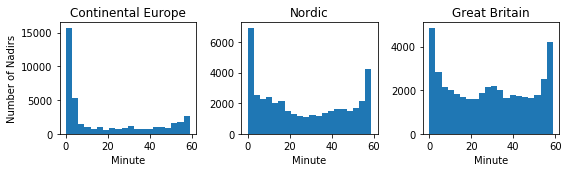

In [151]:
fig, axs=plt.subplots(1,3,figsize=(8,2.5))

for i,area in enumerate(areas):
    print(area)
    freq = pd.read_hdf('../../Frequency_data_preparation/{}'.format(files[area])).loc['2015-01-01':'2019-12-31']
    freq = freq -50
    freq.index=freq.index.tz_convert('UTC')

    nadir_minute = freq.groupby(pd.Grouper(freq='1H')).apply(lambda x: x.abs().idxmax().minute if x.notnull().all() else np.nan)
    
    axs[i].hist(nadir_minute.dropna().values, bins=20)
    axs[i].set_xlabel('Minute')
    axs[i].set_title(area_names[i])

axs[0].set_ylabel('Number of Nadirs')
plt.tight_layout()

plt.savefig(figure_path+'fig_supp7.pdf', bbox_inches='tight')

### Performance evaluation of the machine learning model

### Figure S8

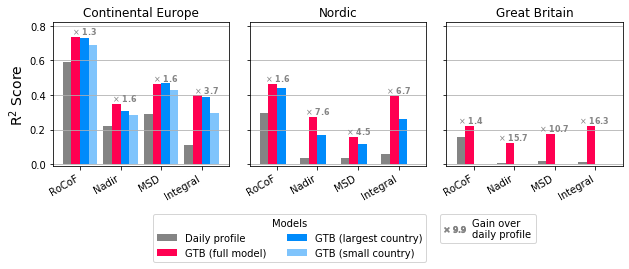

In [152]:
#Comparisson of area-wide and country-level data performance

fig,ax=plt.subplots(1,3,figsize=(8.85,3), sharey=True)

predictors=['daily_profile','gtb_full']
countries={
    'CE':['DE', 'CH'],
    'Nordic':['SE'],
    'GB':[]
}

model_names =  ['Daily profile', 'GTB (full model)', 'GTB (largest country)', 'GTB (small country)']
model_colors = [shap.plots.colors.gray_rgb, shap.plots.colors.red_rgb,  shap.plots.colors.blue_rgb, shap.plots.colors.light_blue_rgb ]

for i,area in enumerate(areas):
    
    scores = pd.DataFrame(index=targets, columns=model_names, dtype='float')
    
    for j,targ in enumerate(targets):

        y_test = pd.read_hdf(version_folder.format(area,version)+'y_test.h5').loc[:,targ]
        y_pred = pd.read_hdf(fit_folder.format(area,version,targ)+'y_pred.h5')
        scores.loc[targ, :2] = [r2_score(y_test, y_pred.loc[:, pred]) for pred in predictors]
        
        for k,country in enumerate(countries[area]):
            y_test = pd.read_hdf(version_folder.format(country,version)+'y_test.h5').loc[:,targ]
            y_pred = pd.read_hdf(fit_folder.format(country,version,targ)+'y_pred.h5')
            scores.iloc[np.argwhere(scores.index==targ)[0], 2+k] = r2_score(y_test, y_pred.loc[:, 'gtb_full']) 
    
    scores.plot.bar(ylim=[-0.02,scores.max().max()+0.05], width=0.85, ax=ax[i], legend=False, color=model_colors)
    ax[i].set_xticks(np.arange(len(targets)))
    ax[i].set_xticklabels(target_names, rotation=30, ha='right')
    ax[i].grid(axis='y')
    ax[i].set_title(area_names[i])
    
    relative_increase = scores.iloc[:,1:].div(scores.iloc[:,0], axis=0)

    for j,targ in enumerate(targets):
    
        ml_gain = relative_increase.loc[targ].max()
        perf_val = scores.loc[targ, relative_increase.loc[targ].idxmax()]
        ax[i].annotate(r'$\times$ {:.1f}'.format(ml_gain), (j-i*0.1-0.2, perf_val+0.015), fontsize=8, c=shap.plots.colors.gray_rgb, fontweight='bold')
    

ax[0].set_ylabel(r'R$^2$ Score', fontsize=14)
ax[0].set_ylim([-0.01,0.82])
plt.tight_layout()

leg1 = ax[1].legend(fontsize=10, bbox_to_anchor=(1.03,-0.3), ncol=2, title='Models')  
annot_text = plt.plot(-10,0, marker=r'$\times$ 9.9', ms=22, lw=0, c=shap.plots.colors.gray_rgb)
leg2 = ax[1].legend(annot_text, ['Gain over \ndaily profile'], fontsize=10, bbox_to_anchor=(1.65,-0.3))  
ax[1].add_artist(leg1)

plt.savefig(figure_path+'fig_supp8.pdf', bbox_inches='tight')

### Figure S9

CE


             GTB (day-ahead)  GTB (full model)
f_rocof            1.230657          1.252288
f_ext              1.322176          1.568046
f_msd              1.536679          1.621498
f_integral         2.560174          3.654114
Nordic


             GTB (day-ahead)  GTB (full model)
f_rocof            1.539586          1.569642
f_ext              2.959953          7.580765
f_msd              2.588365          4.507666
f_integral         2.974825          6.691090
GB


             GTB (day-ahead)  GTB (full model)
f_rocof            1.232815          1.419932
f_ext              7.250382         15.693406
f_msd              8.899104         10.669010
f_integral         7.821035         16.252210


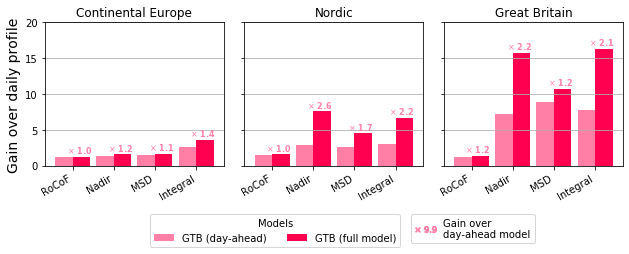

In [153]:
#Comparison of post-hoc and day-ahead model against daily-profile

fig,ax=plt.subplots(1,3,figsize=(8.85,3), sharey=True)

predictors=['daily_profile','gtb_day_ahead','gtb_full']

model_names =  ['Daily profile predictor', 'GTB (day-ahead)', 'GTB (full model)']
model_colors = [ shap.plots.colors.gray_rgb, shap.plots.colors.light_red_rgb, shap.plots.colors.red_rgb]

for i,area in enumerate(areas):
    print(area)
    scores = pd.DataFrame(index=targets, columns=model_names, dtype='float')
    
    for j,targ in enumerate(targets):

        y_test = pd.read_hdf(version_folder.format(area,version)+'y_test.h5').loc[:,targ]
        y_pred = pd.read_hdf(fit_folder.format(area,version,targ)+'y_pred.h5')
        scores.loc[targ] = [r2_score(y_test, y_pred.loc[:, pred]) for pred in predictors]

    relative_increase = scores.iloc[:,1:].div(scores.loc[:,'Daily profile predictor'], axis=0)
    
    print('\n\n',relative_increase)
    #print(scores.iloc[:,1:].add(-scores.loc[:,'Daily profile predictor'], axis=0))
    relative_increase.plot.bar( width=0.85, ax=ax[i], legend=False, color=model_colors[1:])
    ax[i].set_xticks(np.arange(len(targets)))
    ax[i].set_xticklabels(target_names, rotation=30, ha='right')
    ax[i].grid(axis='y')
    ax[i].set_title(area_names[i])
    
    post_hoc_increase = scores.loc[:,'GTB (full model)'].div(scores.loc[:,'GTB (day-ahead)'], axis=0)

    for j,targ in enumerate(targets):
    
        post_hoc_gain = post_hoc_increase.loc[targ]
        perf_val = relative_increase.loc[targ, 'GTB (full model)']
        ax[i].annotate(r'$\times$ {:.1f}'.format(post_hoc_gain), (j-0.15, perf_val+0.5), fontsize=8, c=shap.plots.colors.light_red_rgb, fontweight='bold')
    

ax[0].set_ylabel(r'Gain over daily profile', fontsize=14)
ax[0].set_ylim([-0.01,20])
plt.tight_layout()

leg1 = ax[1].legend(fontsize=10, bbox_to_anchor=(0.9,-0.3), ncol=2, title='Models')  
annot_text = plt.plot(-10,0, marker=r'$\times$ 9.9', ms=22, lw=0, c=shap.plots.colors.light_red_rgb)
leg2 = ax[1].legend(annot_text, ['Gain over \nday-ahead model'], fontsize=10, bbox_to_anchor=(1.65,-0.3))  
ax[1].add_artist(leg1)

plt.savefig(figure_path+'fig_supp9.pdf', bbox_inches='tight')

### Additional results with SHAP values

### Figure S10 - S13

##############  f_rocof  ###################


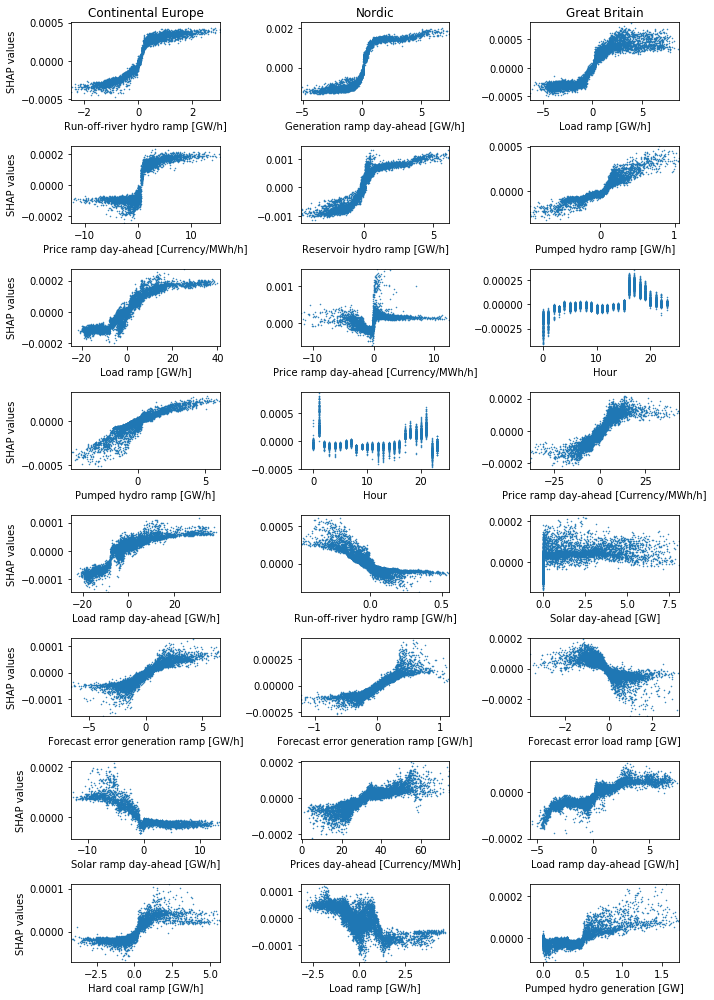

##############  f_msd  ###################


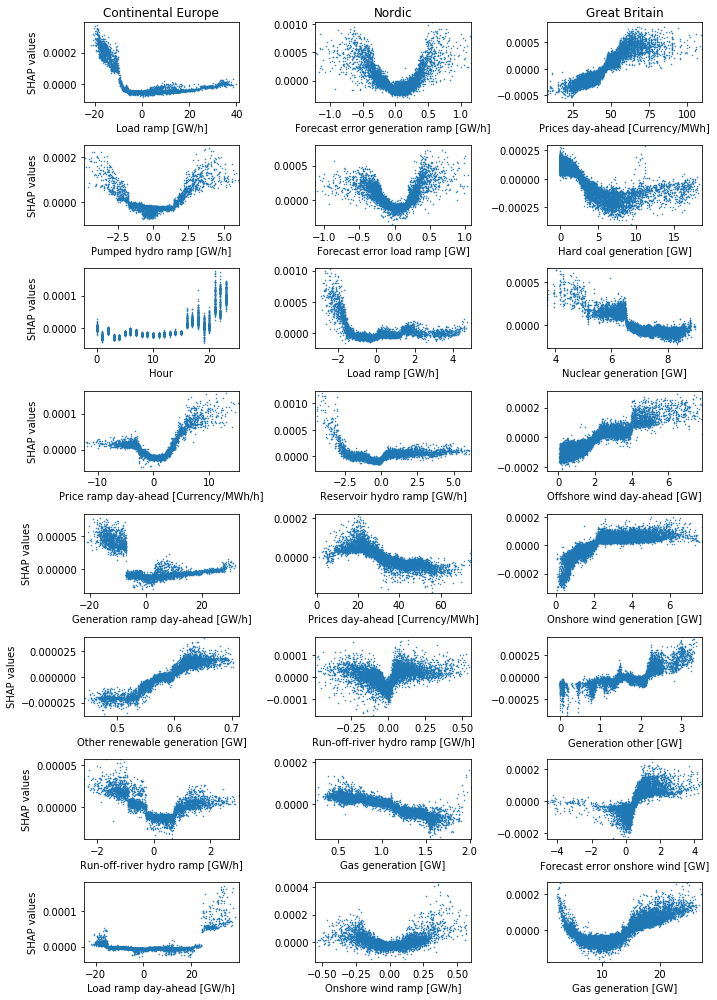

##############  f_integral  ###################


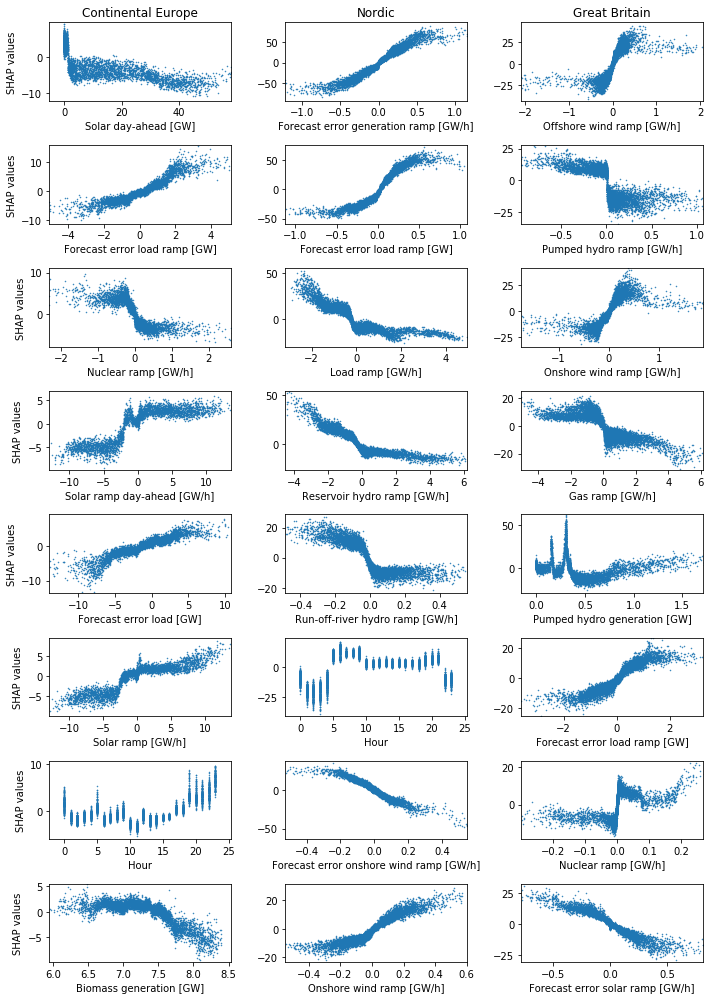

##############  f_ext  ###################


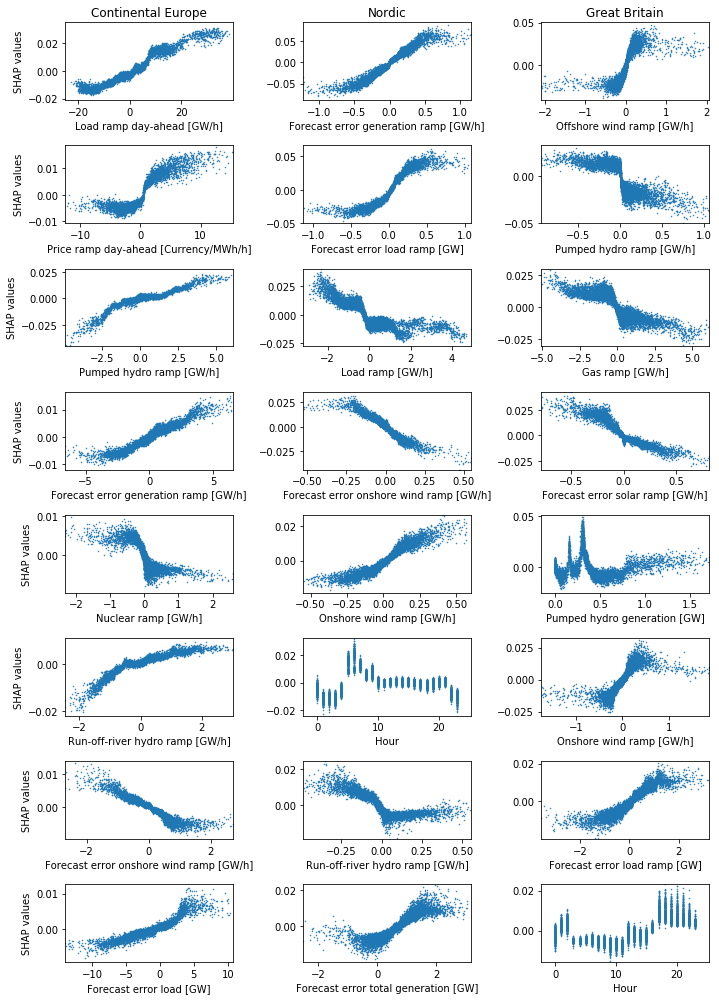

In [154]:
n_features = 8

for k,targ in enumerate(['f_rocof','f_msd', 'f_integral', 'f_ext']):
    fig,ax = plt.subplots(n_features,3,figsize=(10,14))
    
    print('############## ', targ, ' ###################')
    
    for i,area in enumerate(areas):


        shap_vals = np.load(fit_folder.format(area, version, targ)+ 'shap_values_gtb_full.npy')
        X_test = pd.read_hdf(version_folder.format(area, version)+'X_test_full.h5')
        X_test = X_test.mul(input_rescale_factors.reindex(X_test.columns))
        shap_vals = pd.DataFrame(index=X_test.index, columns=X_test.columns, data=shap_vals)
        
        important_features = shap_vals.abs().mean().sort_values(ascending=False).index[:n_features]

        for j, name in enumerate(important_features):

            xlower = X_test.loc[:,name].quantile(0.005)
            xupper =  X_test.loc[:,name].quantile(0.995)
            ylower = pd.Series(shap_vals.loc[:,name]).quantile(0.001)
            yupper =  pd.Series(shap_vals.loc[:,name]).quantile(0.999)

            im=ax[j,i].plot(X_test.loc[:,name],shap_vals.loc[:,name], '.', ms=1, rasterized=True) 

            ax[j,i].set_xlim([xlower-np.abs(xupper-xlower)*0.1,xupper+np.abs(xupper-xlower)*0.1])
            ax[j,i].set_ylim([ylower-np.abs(yupper-ylower)*0.1,yupper+np.abs(yupper-ylower)*0.1])

            ax[j,0].set_ylabel('SHAP values')
            ax[j,i].set_xlabel(input_col_names_units_general[name])
            
        ax[0,i].set_title(area_names[i])


    fig.tight_layout()
    
    plt.savefig(figure_path+'fig_supp{}.pdf'.format(10+k), bbox_inches='tight', dpi=200)
    plt.show()
    plt.close()

### Figure S14

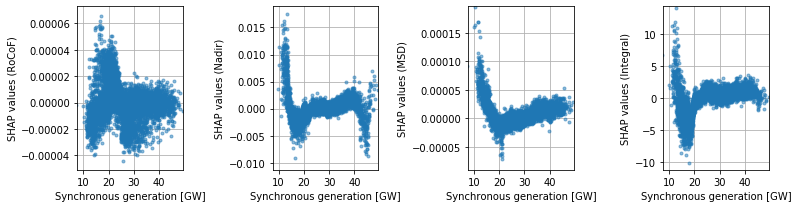

In [155]:
fig,ax = plt.subplots(1,4,figsize=(11,3))
area='GB'

for i,targ in enumerate(targets):


    shap_vals = np.load(fit_folder.format(area, version, targ)+ 'shap_values_gtb_full.npy')
    X_test = pd.read_hdf(version_folder.format(area, version)+'X_test_full.h5')
    X_test = X_test.mul(input_rescale_factors.reindex(X_test.columns))
    shap_vals = pd.DataFrame(index=X_test.index, columns=X_test.columns, data=shap_vals)

    name='synchronous_gen'

    xlower = X_test.loc[:,name].quantile(0.002)
    xupper =  X_test.loc[:,name].quantile(0.998)
    ylower = pd.Series(shap_vals.loc[:,name]).quantile(0.0001)
    yupper =  pd.Series(shap_vals.loc[:,name]).quantile(0.9999)

    im=ax[i].plot(X_test.loc[:,name],shap_vals.loc[:,name], 'o', ms=3, alpha=0.5,rasterized=True) 

    ax[i].set_xlim([xlower-np.abs(xupper-xlower)*0.1,xupper+np.abs(xupper-xlower)*0.1])
    ax[i].set_ylim([ylower-np.abs(yupper-ylower)*0.1,yupper+np.abs(yupper-ylower)*0.1])

    ax[i].set_ylabel('SHAP values ({})'.format(target_names[i]))
    ax[i].set_xlabel(input_col_names_units[name])
    ax[i].grid(True)
    ax[i].set_xticks([10,20,30,40])
    
plt.tight_layout()
plt.savefig(figure_path+'fig_supp14.pdf', bbox_inches='tight', dpi=200)

###  Feature importances and ranks of synchronous_generation for discussion in Note S6

In [156]:
for area in areas:
    print(area)
    for i,targ in enumerate(targets):
        print(targ)

        shap_vals = np.load(fit_folder.format(area, version, targ)+ 'shap_values_gtb_full.npy')
        X_test = pd.read_hdf(version_folder.format(area, version)+'X_test_full.h5')

        shap_vals = pd.DataFrame(index=X_test.index, columns=X_test.columns, data=shap_vals)

        feature_importances = shap_vals.abs().mean().div(shap_vals.abs().mean().max())
        fi = feature_importances.loc['synchronous_gen']
        fi_rank = feature_importances.rank(ascending=False).loc['synchronous_gen']
        print('Relative importance: ', fi)
        print('Importance rank: ', fi_rank)
    print()

CE
f_rocof
Relative importance:  0.017696306
Importance rank:  19.0
f_ext
Relative importance:  0.038977668
Importance rank:  55.0
f_msd
Relative importance:  0.01176325
Importance rank:  39.0
f_integral
Relative importance:  0.056038804
Importance rank:  64.0

Nordic
f_rocof
Relative importance:  0.008556304
Importance rank:  38.0
f_ext
Relative importance:  0.02540829
Importance rank:  45.0
f_msd
Relative importance:  0.039134406
Importance rank:  52.0
f_integral
Relative importance:  0.02121864
Importance rank:  50.0

GB
f_rocof
Relative importance:  0.028710527
Importance rank:  25.0
f_ext
Relative importance:  0.07372004
Importance rank:  40.0
f_msd
Relative importance:  0.04782121
Importance rank:  39.0
f_integral
Relative importance:  0.094551206
Importance rank:  33.0

